In [1]:
import torch
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import os
import pathlib
import json
from collections import defaultdict

import sys
# the mock-0.3.1 dir contains testcase.py, testutils.py & mock.py
sys.path.append('/home/levaid/bigstorage/open_lth')
from open_lth import *

from matplotlib import rc, rcParams
# rc('font',**{'family':['serif'],'serif':['Computer Modern Roman']})
rc('font', **{'family':'serif','serif':'Computer Modern'})
rc('text', usetex=True)

In [2]:
def convert_weight_to_mask(layer_name):
    name = layer_name.split('.')
    return(f'mask_{name[1]}___{name[2]}___{name[3]}___{name[4]}')

def convert_mask_to_weight(mask_name):
    name = [x for x in mask_name.split('_') if x != '']
    return(f"model.{'.'.join(name[1:])}")

In [27]:
# experiment_name = 'lottery_1a33bed04f87d8f96b8774aebc4aa8d6' # SNIP VGG-11
# pruning_strat = 'SNIP global'
# experiment_name = 'lottery_26d0b2b6ea66aefbe3811e2289b2a78a' # sparse VGG-11

# experiment_name = 'lottery_e6dc86114120217d26411ed6aa033318' # SNIP Resnet20
experiment_name = 'lottery_31ef6d1c09469a516b6742d9fe99305e' # sparse Resnet20

basepath = os.path.join('/home/levaid/bigstorage/open_lth_data', experiment_name)
replicate_id = 'replicate_1'
hparams = pathlib.Path(os.path.join(basepath, replicate_id, 'level_0/main/hparams.log')).read_text()
print(hparams)
distances = defaultdict(list)
weight_dict = None
mask_sizes = defaultdict(list)
weight_tensors, grad_tensors, mask_tensors = defaultdict(list), defaultdict(list), defaultdict(list)
for level in sorted(os.listdir(os.path.join(basepath, replicate_id))):
    model = torch.load(os.path.join(basepath, replicate_id, level, 'main/checkpoint.pth'), map_location={'cuda:0': 'cpu'})
    weight_dict = {name: tensor for name, tensor in model['model_state_dict'].state_dict().items() if 'conv' in name and 'weight' in name}
    with open(os.path.join(basepath, replicate_id, level, 'main', 'sparsity_report.json')) as f:
        pruning_report = json.load(f)
    pruning_percent = pruning_report['unpruned'] / pruning_report['total']
    for layer_name in weight_dict.keys():     
        if 'mask' in layer_name:
            mask_sizes[layer_name] += [np.mean(weight_dict[layer_name].numpy())]
            mask_tensors[convert_mask_to_weight(layer_name)] += [weight_dict[layer_name]]
            
        else:
            weight_tensors[layer_name] += [weight_dict[layer_name]]
            grad_tensors[layer_name] += [model['model_state_dict'].grads[layer_name]]
            


Dataset Hyperparameters
    * dataset_name => cifar10
    * batch_size => 128
    * do_not_augment => True
Model Hyperparameters
    * model_name => cifar_resnet_20
    * model_init => kaiming_normal
    * batchnorm_init => uniform
Pruning Hyperparameters
    * pruning_strategy => sparse_global
    * pruning_fraction => 0.5
Training Hyperparameters
    * optimizer_name => sgd
    * lr => 0.1
    * training_steps => 80ep
    * momentum => 0.1
    * milestone_steps => 60ep
    * gamma => 0.1
    * weight_decay => 0.0001


In [20]:
# weight_tensors['model.layers.1.conv.weight'][0]

In [21]:
weight_tensors.keys()

dict_keys(['model.conv.weight', 'model.blocks.0.conv1.weight', 'model.blocks.0.conv2.weight', 'model.blocks.1.conv1.weight', 'model.blocks.1.conv2.weight', 'model.blocks.2.conv1.weight', 'model.blocks.2.conv2.weight', 'model.blocks.3.conv1.weight', 'model.blocks.3.conv2.weight', 'model.blocks.4.conv1.weight', 'model.blocks.4.conv2.weight', 'model.blocks.5.conv1.weight', 'model.blocks.5.conv2.weight', 'model.blocks.6.conv1.weight', 'model.blocks.6.conv2.weight', 'model.blocks.7.conv1.weight', 'model.blocks.7.conv2.weight', 'model.blocks.8.conv1.weight', 'model.blocks.8.conv2.weight'])

In [ ]:
# y tengelyeket vegyem 
# a 3 oszlop tetejen
# 

color = sns.color_palette()[0]
layer = 'model.blocks.8.conv2.weight'
f, axes = plt.subplots(8, 3, figsize = (8, 16), constrained_layout=False, dpi =300, facecolor='w')
f.subplots_adjust(hspace=0.35, wspace=0.0)

for level in range(8):
    f.suptitle('Distribution of parameters and gradients in the last convolutional layer\nResnet20, CIFAR-10, gradient-sensitive', y=0.92)
    weight_tensor = weight_tensors[layer][level].flatten()
    grad_tensor = grad_tensors[layer][level].flatten()
    
    product_tensor = np.sort((grad_tensor * weight_tensor.numpy())[weight_tensor != 0.])
    grad_tensor = np.sort(grad_tensor[weight_tensor != 0.])
    weight_tensor = np.sort(weight_tensor[weight_tensor != 0.])
    
    # weight_tensor = weight_tensor[weight_tensor != 0.]
    weight_tensor = weight_tensor[int(len(weight_tensor) * 0.001): int(len(weight_tensor) * 0.999)]
    grad_tensor = grad_tensor[int(len(grad_tensor) * 0.1): int(len(grad_tensor) * 0.9)]
    product_tensor = product_tensor[int(len(grad_tensor) * 0.1): int(len(product_tensor) * 0.9)]

    print(weight_tensor.shape)
    
    
    sns.distplot(np.random.choice(weight_tensor, 10000), ax = axes[level][0], color=color)
    sns.distplot(np.random.choice(grad_tensor, 10000), ax = axes[level][1], color=color)
    sns.distplot(np.random.choice(product_tensor, 10000), ax = axes[level][2], color=color)
    
    axes[level][0].set_title(f'level\_{level}, weights: {len(weight_tensor)}', fontsize='small', loc='left')
    axes[level][1].set_title(f'grads', fontsize='small')
    axes[level][2].set_title(f'weights*grads', fontsize='small')
    # plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
    for ax in axes[level]:
        ax.get_yaxis().set_visible(False)
        ax.xaxis.get_offset_text().set_fontsize('small')
        ax.ticklabel_format(axis='x', scilimits=(0, 10), style='sci', useMathText=True)
        for tick in ax.xaxis.get_major_ticks():
            tick.label.set_fontsize('small')
    
    

    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18


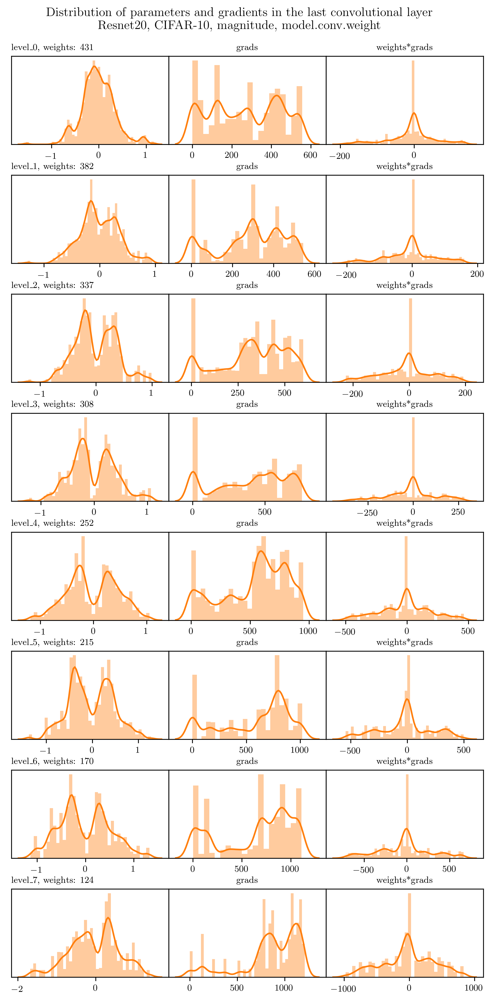

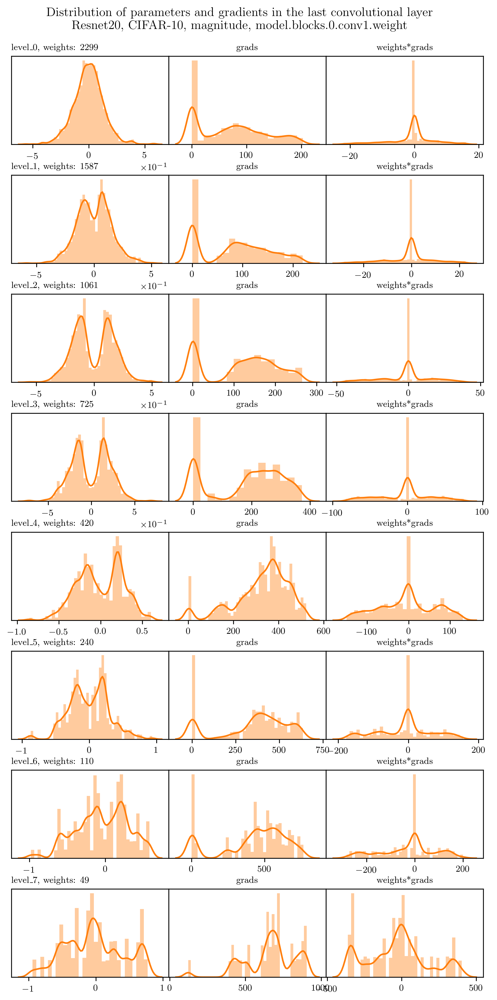

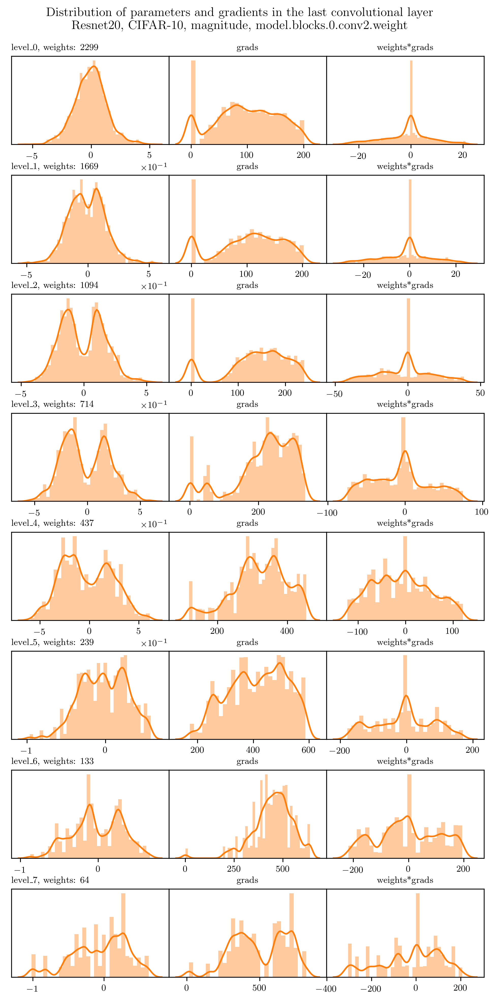

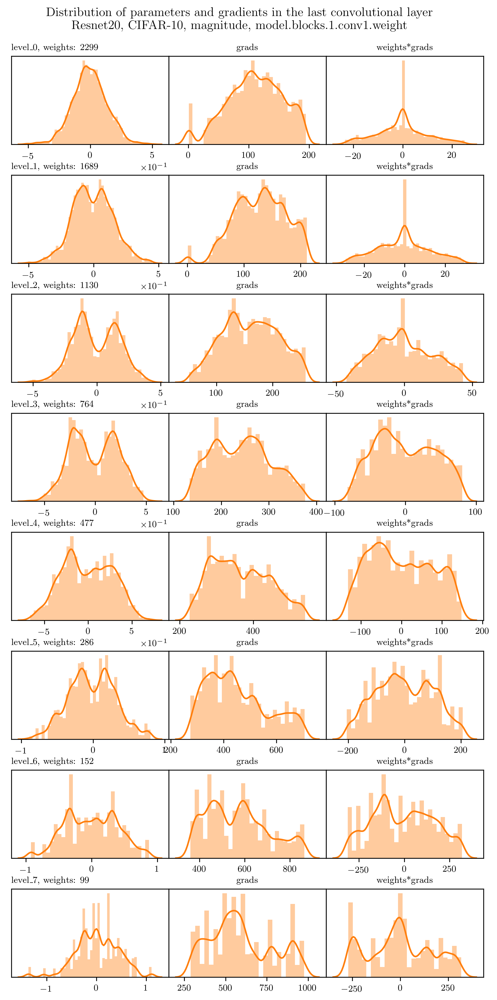

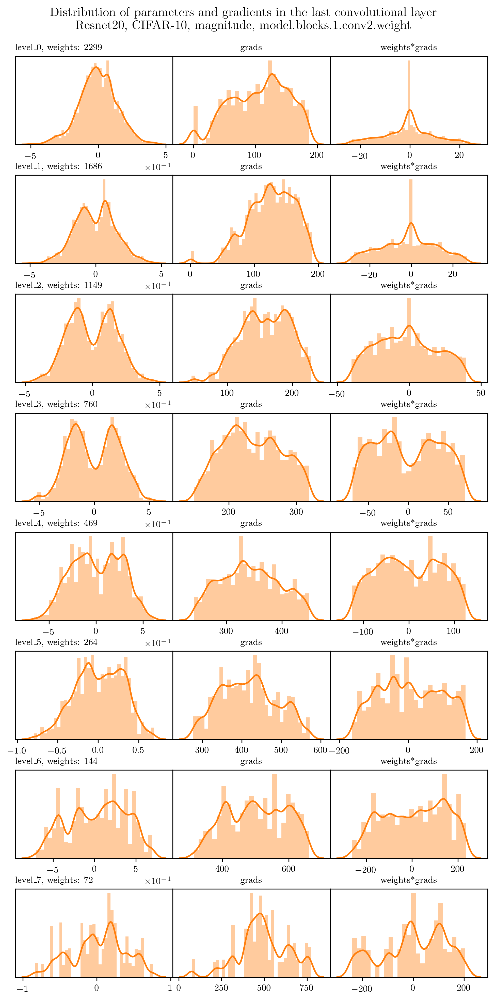

...

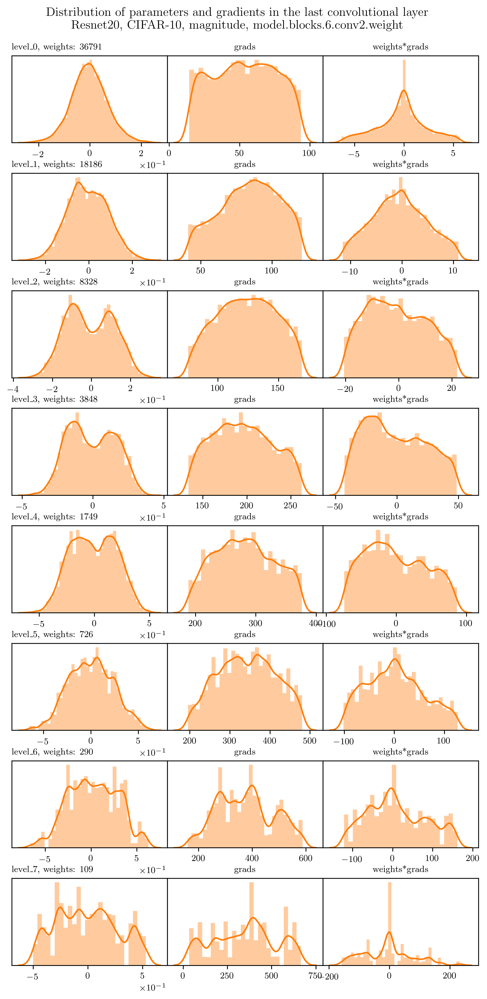

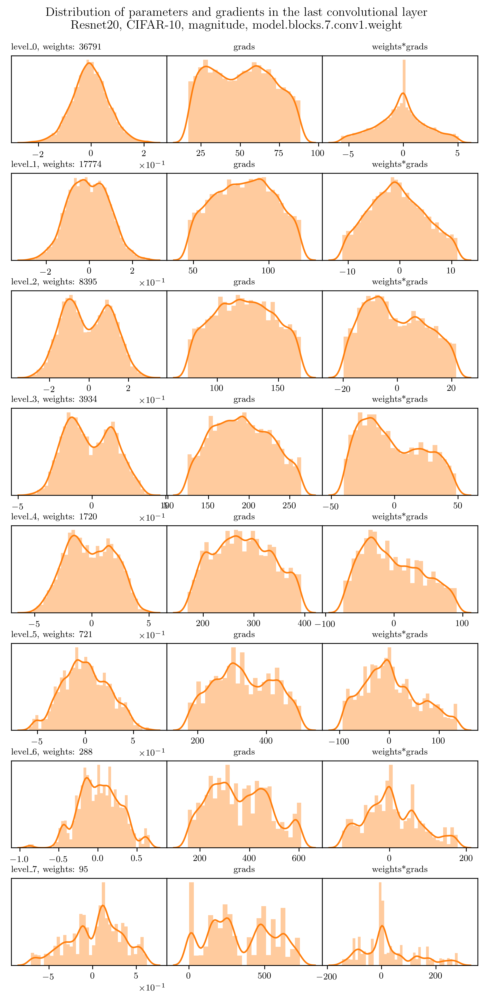

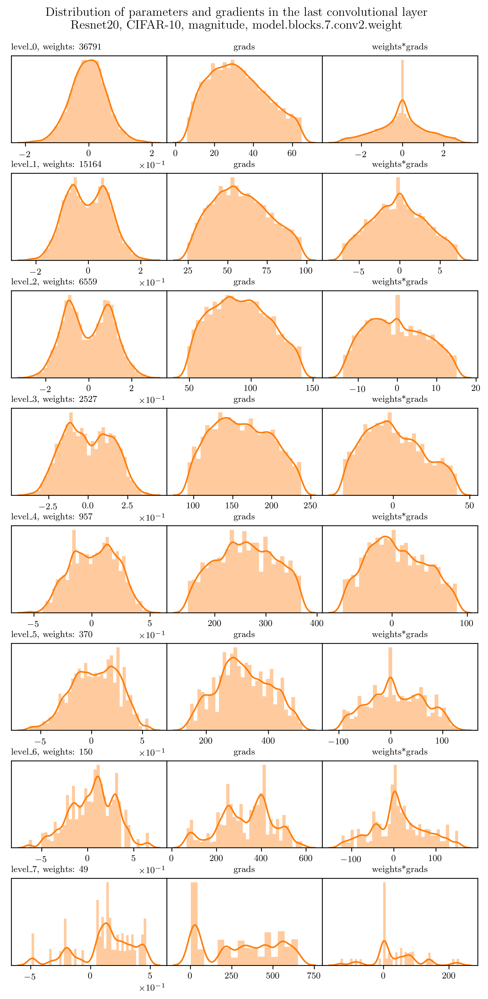

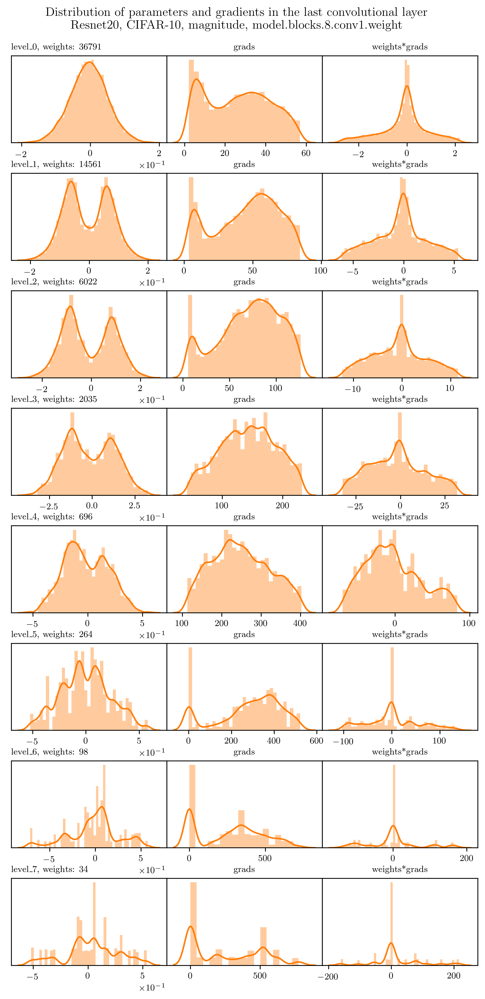

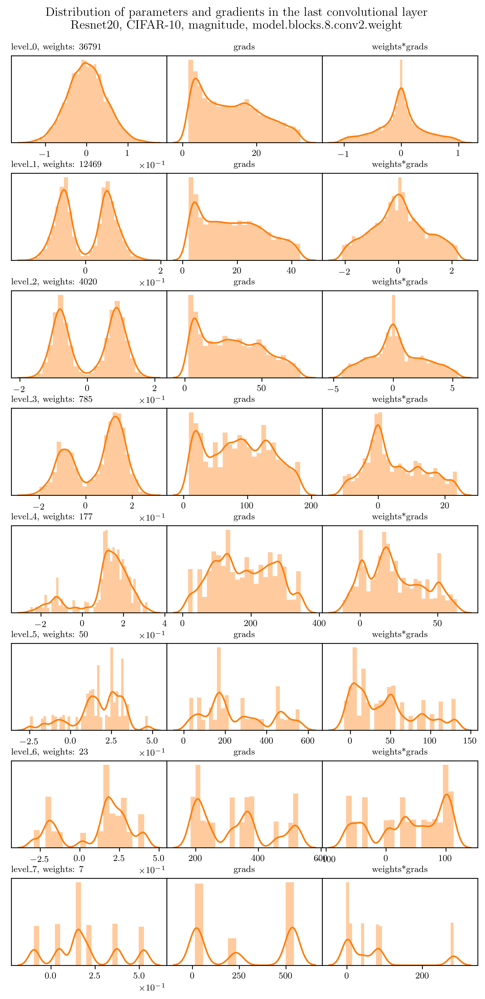

In [31]:
# y tengelyeket vegyem 
# a 3 oszlop tetejen
# 
for file_index, layer in enumerate(weight_tensors.keys()):
    color = sns.color_palette()[1]
    f, axes = plt.subplots(8, 3, figsize = (8, 16), constrained_layout=False, dpi =300, facecolor='w')
    f.subplots_adjust(hspace=0.35, wspace=0.0)

    for level in range(8):
        f.suptitle(f'Distribution of parameters and gradients in the last convolutional layer\nResnet20, CIFAR-10, magnitude, {layer}', y=0.92)
        weight_tensor = weight_tensors[layer][level].flatten()
        grad_tensor = grad_tensors[layer][level].flatten()

        product_tensor = np.sort((grad_tensor * weight_tensor.numpy())[weight_tensor != 0.])
        grad_tensor = np.sort(grad_tensor[weight_tensor != 0.])
        weight_tensor = np.sort(weight_tensor[weight_tensor != 0.])

        # weight_tensor = weight_tensor[weight_tensor != 0.]
        weight_tensor = weight_tensor[int(len(weight_tensor) * 0.001): int(len(weight_tensor) * 0.999)]
        grad_tensor = grad_tensor[int(len(grad_tensor) * 0.1): int(len(grad_tensor) * 0.9)]
        product_tensor = product_tensor[int(len(grad_tensor) * 0.1): int(len(product_tensor) * 0.9)]

        # print(weight_tensor.shape)


        sns.distplot(np.random.choice(weight_tensor, 10000), ax = axes[level][0], color=color)
        sns.distplot(np.random.choice(grad_tensor, 10000), ax = axes[level][1], color=color)
        sns.distplot(np.random.choice(product_tensor, 10000), ax = axes[level][2], color=color)

        axes[level][0].set_title(f'level\_{level}, weights: {len(weight_tensor)}', fontsize='small', loc='left')
        axes[level][1].set_title(f'grads', fontsize='small')
        axes[level][2].set_title(f'weights*grads', fontsize='small')
        # plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
        for ax in axes[level]:
            ax.get_yaxis().set_visible(False)
            ax.xaxis.get_offset_text().set_fontsize('small')
            ax.ticklabel_format(axis='x', scilimits=(0, 10), style='sci', useMathText=True)
            for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize('small')
    
    plt.show()
    print(file_index)

    

In [78]:
def get_differences_for_layer(experiment_name):

    df_data = []
    basepath = os.path.join('/home/levaid/bigstorage/open_lth_data', experiment_name)
    replicate_id = 'replicate_1'
    hparams = pathlib.Path(os.path.join(basepath, replicate_id, 'level_0/main/hparams.log')).read_text()
    print(hparams)
    for replicate in os.listdir(basepath):
    # 
        distances = defaultdict(list)
        weight_dict = None
        mask_sizes = defaultdict(list)
        weight_tensors, grad_tensors, mask_tensors = defaultdict(list), defaultdict(list), defaultdict(list)
        for level in sorted(os.listdir(os.path.join(basepath, replicate_id))):
            model = torch.load(os.path.join(basepath, replicate_id, level, 'main/checkpoint.pth'), map_location={'cuda:0': 'cpu'})
            weight_dict = {name: tensor for name, tensor in model['model_state_dict'].state_dict().items() if ('conv' in name or 'fc' in name) and 'weight' in name}
            with open(os.path.join(basepath, replicate_id, level, 'main', 'sparsity_report.json')) as f:
                pruning_report = json.load(f)
            pruning_percent = pruning_report['unpruned'] / pruning_report['total']
            for layer_name in weight_dict.keys():     
                if 'mask' in layer_name:
                    mask_sizes[layer_name] += [np.mean(weight_dict[layer_name].numpy())]
                    mask_tensors[convert_mask_to_weight(layer_name)] += [weight_dict[layer_name]]

                else:
                    weight_tensors[layer_name] += [weight_dict[layer_name]]
                    grad_tensors[layer_name] += [model['model_state_dict'].grads[layer_name]]
        
        for layer in weight_tensors.keys():
            init_tensor = weight_tensors[layer][0].numpy()
            # print(hparams.split('\n')[9])
            for index in range(1,8):
                previous_weight_tensor = weight_tensors[layer][index-1].numpy()
                weight_tensor = weight_tensors[layer][index].numpy()
                difference_to_init = weight_tensor[weight_tensor != 0.].flatten() - init_tensor[weight_tensor != 0.].flatten()
                difference_to_previous = weight_tensor[weight_tensor != 0.].flatten() - previous_weight_tensor[weight_tensor != 0.].flatten()
                # print(init_tensor.shape, previous_weight_tensor.shape, weight_tensor.shape, difference_to_init.shape, difference_to_previous.shape)
                distance_from_init = np.mean(np.abs(difference_to_init))
                distance_from_prev = np.mean(np.abs(difference_to_previous))
                # print(f'level_{index}, params: {len(difference_to_init)} dist_init: {distance_from_init:.6f}, dist_prev: {distance_from_prev:.6f}')
                df_data += [(layer, index, len(difference_to_init), distance_from_init, 'init')]
                df_data += [(layer, index, len(difference_to_init), distance_from_prev, 'prev')]
    return(pd.DataFrame(df_data, columns = ['layer_name', 'level', 'parameters', 'distance', 'distance_type']))

In [79]:
experiment_name = 'lottery_1a33bed04f87d8f96b8774aebc4aa8d6' # SNIP
snip_df = get_differences_for_layer(experiment_name)
sparse_df = get_differences_for_layer('lottery_26d0b2b6ea66aefbe3811e2289b2a78a') # sparse
# experiment_name = '' # sparse

Dataset Hyperparameters
    * dataset_name => cifar10
    * batch_size => 128
    * do_not_augment => True
Model Hyperparameters
    * model_name => cifar_vgg_11
    * model_init => kaiming_normal
    * batchnorm_init => uniform
Pruning Hyperparameters
    * pruning_strategy => snip_global
    * pruning_fraction => 0.5
Training Hyperparameters
    * optimizer_name => sgd
    * lr => 0.1
    * training_steps => 60ep
    * momentum => 0.1
    * milestone_steps => 40ep
    * gamma => 0.1
    * weight_decay => 0.0001
Dataset Hyperparameters
    * dataset_name => cifar10
    * batch_size => 128
    * do_not_augment => True
Model Hyperparameters
    * model_name => cifar_vgg_11
    * model_init => kaiming_normal
    * batchnorm_init => uniform
Pruning Hyperparameters
    * pruning_strategy => sparse_global
    * pruning_fraction => 0.5
Training Hyperparameters
    * optimizer_name => sgd
    * lr => 0.1
    * training_steps => 60ep
    * momentum => 0.1
    * milestone_steps => 40ep
    * ga

In [80]:
snip_df['strategy'] = 'snip'
sparse_df['strategy'] = 'sparse'
df = snip_df.append(sparse_df)

In [81]:
snip_df

,layer_name,level,parameters,distance,distance_type,strategy
0,model.layers.0.conv.weight,1,1710,0.016606,init,snip
1,model.layers.0.conv.weight,1,1710,0.016606,prev,snip
2,model.layers.0.conv.weight,2,1649,0.017475,init,snip
3,model.layers.0.conv.weight,2,1649,0.012892,prev,snip
4,model.layers.0.conv.weight,3,1583,0.020522,init,snip
...,...,...,...,...,...,...
625,model.fc.weight,5,1666,0.030289,prev,snip
626,model.fc.weight,6,1059,0.088162,init,snip
627,model.fc.weight,6,1059,0.060176,prev,snip
628,model.fc.weight,7,584,0.181156,init,snip


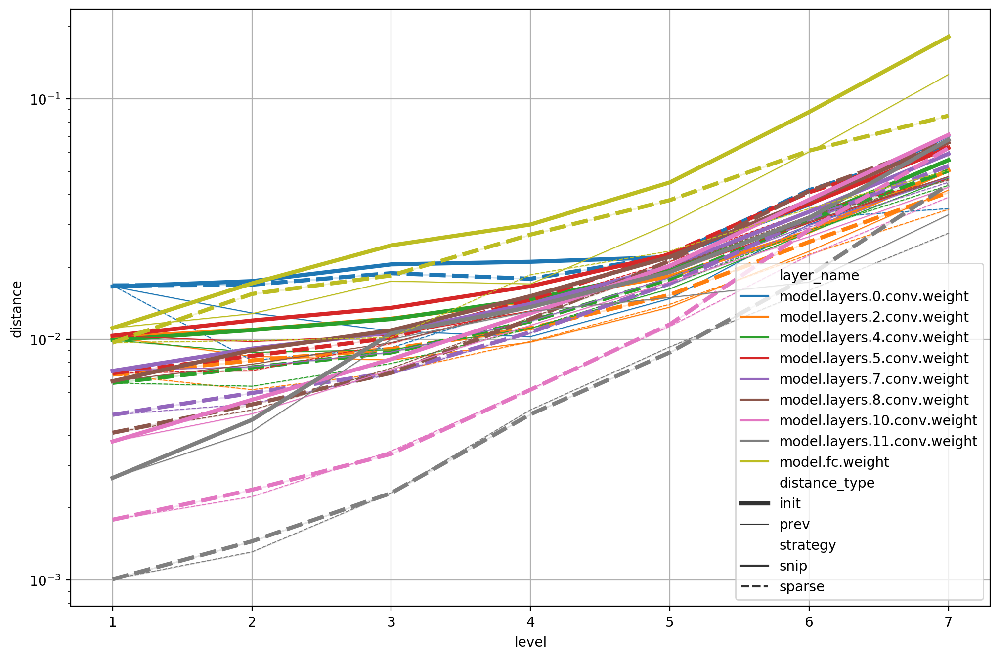

In [82]:
plt.figure(figsize=(12,8), dpi = 200, facecolor='w')
sns.lineplot(x='level', y='distance', data=df, hue='layer_name', style = 'strategy', size='distance_type')
plt.yscale('log')
# sns.lineplot(x='level', y='distance_from_prev', data=snip_df, legend='full')
#sns.lineplot(x='level', y='distance_from_init', data=sparse_df, legend='full')
# sns.lineplot(x='level', y='distance_from_prev', data=sparse_df, legend='full')
plt.grid()

In [42]:
init_tensor = weight_tensors[layer][0].numpy()
print(hparams.split('\n')[9])
for index in range(1,8):
    previous_weight_tensor = weight_tensors[layer][index-1].numpy()
    weight_tensor = weight_tensors[layer][index].numpy()
    difference_to_init = weight_tensor[weight_tensor != 0.].flatten() - init_tensor[weight_tensor != 0.].flatten()
    difference_to_previous = weight_tensor[weight_tensor != 0.].flatten() - previous_weight_tensor[weight_tensor != 0.].flatten()
    # print(init_tensor.shape, previous_weight_tensor.shape, weight_tensor.shape, difference_to_init.shape, difference_to_previous.shape)
    distance_from_init = np.mean(np.abs(difference_to_init))
    distance_from_prev = np.mean(np.abs(difference_to_previous))
    print(f'level_{index}, params: {len(difference_to_init)} dist_init: {distance_from_init:.6f}, dist_prev: {distance_from_prev:.6f}')

    * pruning_strategy => snip_global
level_1, params: 569080 dist_init: 0.002659, dist_prev: 0.002659
level_2, params: 117954 dist_init: 0.004636, dist_prev: 0.004150
level_3, params: 19730 dist_init: 0.010595, dist_prev: 0.010021
level_4, params: 7651 dist_init: 0.013643, dist_prev: 0.013093
level_5, params: 2418 dist_init: 0.019071, dist_prev: 0.014943
level_6, params: 1218 dist_init: 0.032050, dist_prev: 0.017314
level_7, params: 572 dist_init: 0.067677, dist_prev: 0.032992


'    * pruning_strategy => sparse_global'

In [159]:
level = 6
weight_tensor = weight_tensors[layer][level].flatten()
grad_tensor = grad_tensors[layer][level].flatten()
    
    # product_tensor = np.sort((grad_tensor * weight_tensor.numpy())[weight_tensor != 0.])
grad_tensor = np.sort(grad_tensor[weight_tensor != 0.])
weight_tensor = np.sort(weight_tensor[weight_tensor != 0.])

In [163]:
np.sum(grad_tensor == 0.)

16